# Cities & Settlements in the Chronicles of Theophanes
## *Intelligent document Analysis*

In [67]:
"Packages to be installed"
!pip3 install spacy-transformers
!pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [68]:
"Packages/libraries to be imported"
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
import io
import unicodedata
import string
import spacy.cli
spacy.cli.download("en_core_web_trf")
import spacy_transformers
import spacy
import pandas as pd
import re
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_trf')


Data import and Cleaning

In [69]:
"""Reading the file line by line."""
theo_sentences_list = []
with open("Theophanes_1.txt") as theo_file:
    for line in theo_file:
      stripped_line =  line.strip();
      if stripped_line:
        theo_sentences_list.append(stripped_line);
print("Theo_sentences_list::", theo_sentences_list)
print(len(theo_sentences_list))

Theo_sentences_list:: ['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius as p

In [70]:
"""Data Cleaning & Preprocessing"""
#Cleaning up for '\n' 
new_theo_sentence_list = [];
for sentence in theo_sentences_list:
  n_sentence = sentence.replace("\n", " ");
  new_theo_sentence_list.append(n_sentence);
print("New Theo Sentence List::", new_theo_sentence_list);
print(len(new_theo_sentence_list))

New Theo Sentence List:: ['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius a

In [71]:
"""Clear off the empty strings"""
new_theo_sentence_list = list(filter(None, new_theo_sentence_list))
print(new_theo_sentence_list)

['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius as partner in his rule, it

In [72]:
"Sentence Tokenization"
from nltk.tokenize import sent_tokenize
corpus_list = []
for sentence in new_theo_sentence_list:
  if "." in sentence:
    sentences = sent_tokenize(sentence)
    for each_sentence in sentences:
      corpus_list.append(each_sentence)
  else:
    corpus_list.append(sentence)
print(corpus_list)
print(len(corpus_list))

['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius as partner in his rule, it

In [73]:
"""Removing white spaces and empty strings among tokens or words"""
n_t_s_list = []
for sentence in corpus_list:
    sentence = sentence.split(" ")
    sentence_list = list(filter(None, sentence))
    new_sentence = " ".join(sentence_list)
    n_t_s_list.append(new_sentence)
print(n_t_s_list)

['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius as partner in his rule, it

In [74]:
"Total Number of Sentences"
len_of_sentences_corpora = len(n_t_s_list)
print(len_of_sentences_corpora)

10216


In [75]:
"Removing Contracted words!"
import contractions
new_nts_list = []
for sentence in n_t_s_list:
  sentence_modified = contractions.fix(sentence)
  new_nts_list.append(sentence_modified)

print("Modified sentences::", new_nts_list)

Modified sentences:: ['(AM 5777, AD 284/5)', 'Year of the divine Incarnation 277', 'Diocletian, emperor of the Romans (20 years), 1st year', 'Varraches, emperor of the Persians (17 years), 15th year', 'Gaius, 29th bishop of Rome3 (15 years), 7th year', 'Hymenaios, 28th bishop of Jerusalem4 (24 years), 13th year', 'Theonas, 16th bishop of Alexandria (19 years), 11th year', 'Tyrannos, 19th bishop of Antioch (13 years), 2nd year', '(AM 5778, AD 285/6)', 'Diocletian, 2nd year', 'Varraches, 16th year', 'Gaius, 8th year', 'Hymenaios, 14th year', 'Theonas, 12th year', 'Tyrannos, 3rd year', '(AM 5779, AD 286/7)', 'Diocletian, 3rd year', 'Varraches, 17th year', 'Gaius, 9th year', 'Hymenaios, 15th year', 'Theonas, 13th year', 'Tyrannos, 4th year', '(AM 5780 AD 287/8)', 'Diocletian, 4th year', 'Vararanes, emperor of the Persians (1 year), 1st year', 'Gaius, 10th year', 'Hymenaios, 16th year', 'Theonas, 14th year', 'Tyrannos, 5th year', 'In this year Diocletian appointed Maximianus Herculius as pa

In [76]:
"Remove Punctutation"
theo_corpus = []
for sentence in range(len_of_sentences_corpora):
  temp_sent = re.sub('[^a-zA-Z0-9/]', ' ', new_nts_list[sentence]);
  temp_sent = temp_sent.lower();
  temp_sent = temp_sent.split()
  temp_sent = " ".join(temp_sent)
  theo_corpus.append(temp_sent)
print(theo_corpus)

['am 5777 ad 284/5', 'year of the divine incarnation 277', 'diocletian emperor of the romans 20 years 1st year', 'varraches emperor of the persians 17 years 15th year', 'gaius 29th bishop of rome3 15 years 7th year', 'hymenaios 28th bishop of jerusalem4 24 years 13th year', 'theonas 16th bishop of alexandria 19 years 11th year', 'tyrannos 19th bishop of antioch 13 years 2nd year', 'am 5778 ad 285/6', 'diocletian 2nd year', 'varraches 16th year', 'gaius 8th year', 'hymenaios 14th year', 'theonas 12th year', 'tyrannos 3rd year', 'am 5779 ad 286/7', 'diocletian 3rd year', 'varraches 17th year', 'gaius 9th year', 'hymenaios 15th year', 'theonas 13th year', 'tyrannos 4th year', 'am 5780 ad 287/8', 'diocletian 4th year', 'vararanes emperor of the persians 1 year 1st year', 'gaius 10th year', 'hymenaios 16th year', 'theonas 14th year', 'tyrannos 5th year', 'in this year diocletian appointed maximianus herculius as partner in his rule it being his fourth year', 'am 5781 ad 288/9', 'diocletian 

Exploratory or Descriptive Analysis

In [77]:
""" Adding the text data to a dataframe - for descriptive analysis"""
theo_df = pd.DataFrame({'Theo_sentences':theo_corpus})
theo_df.head()

,Theo_sentences
0,am 5777 ad 284/5
1,year of the divine incarnation 277
2,diocletian emperor of the romans 20 years 1st ...
3,varraches emperor of the persians 17 years 15t...
4,gaius 29th bishop of rome3 15 years 7th year


In [78]:
theo_df.describe()

,Theo_sentences
count,10216
unique,9782
top,john 6th year
freq,11


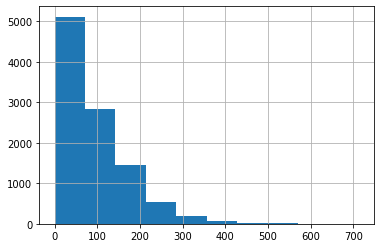

In [79]:
"Fundamental descriptive Analysis"

"1. Sentence Length Analysis"
theo_df['Theo_sentences'].str.len().hist()

In [80]:
"2. Frequency Distribution"
from nltk.probability import FreqDist
from nltk import word_tokenize
from nltk.corpus import stopwords

words_without_stopwords = []
stop_words = stopwords.words('english')
for sentence in theo_corpus:
  word_list = word_tokenize(sentence)
  for word in word_list:
    if word not in stop_words:
      words_without_stopwords.append(word)
frequency = FreqDist(words_without_stopwords)
frequency.most_common(10)

[('year', 3941),
 ('emperor', 1556),
 ('years', 1110),
 ('bishop', 956),
 ('ad', 529),
 ('sent', 482),
 ('many', 470),
 ('romans', 420),
 ('city', 403),
 ('john', 399)]

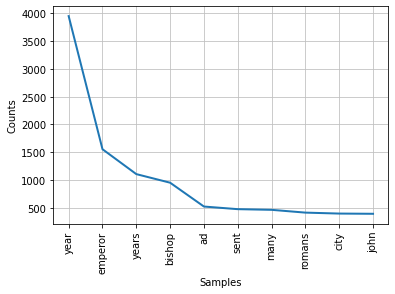

In [81]:
"2.A Plotting Frequency Distribution of top 10 words"
import matplotlib.pyplot as plt
frequency.plot(10)


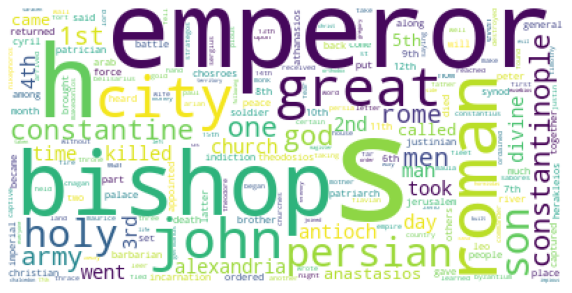

In [82]:
"3. Word Cloud to identify the word importance - Data is required in the form of a corpus: theo_corpus"
words_to_ignore_list = ['year','years', 'ad','many','sent']

theo_big_string = ' '.join(theo_corpus)
for word in words_to_ignore_list:
  theo_big_string = theo_big_string.replace(word, "")

theo_cloud = WordCloud(collocations = False, background_color = 'white').generate(theo_big_string)
plt.figure(figsize=(10,10))
plt.imshow(theo_cloud)
plt.axis("off")
plt.show()

In [83]:
"4. POS Tagging using Spacy"
nlp = spacy.load("en_core_web_sm")
dictionary_to_ignore = ['ad', 'year', 'incarnation','emperor','years','bishop', 'man', 'sight',]

text_propernoun_list =[]
text_adjective_list=[]

parts_of_speech_propernoun_list = []
parts_of_speech_adjective_list = []

lemma_propernoun_list=[]
lemma_adjective_list = []

for sentence in theo_corpus:
  sentence=nlp(sentence)
  for tok in sentence:
    if tok.pos_=='PROPN':
      parts_of_speech_propernoun_list.append(tok.pos_)
      text_propernoun_list.append(tok.text)
      lemma_propernoun_list.append(tok.lemma_)
    elif tok.pos_ == 'ADJ':
      parts_of_speech_adjective_list.append(tok.pos_)
      text_adjective_list.append(tok.text)
      lemma_adjective_list.append(tok.lemma_)
    else:
      pass

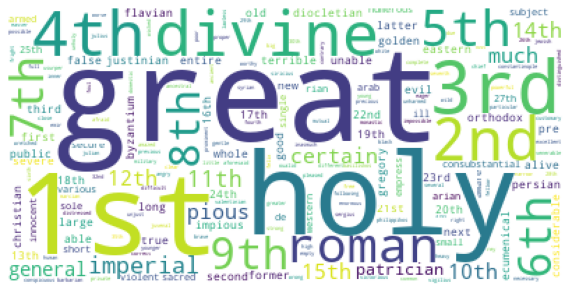

In [84]:
"5. Word cloud for Adjective!"
words_to_ignore_list = ['year','years', 'ad','many','sent']

pos_adj_big_string = ' '.join(text_adjective_list)
for word in words_to_ignore_list:
  pos_adj_big_string = pos_adj_big_string.replace(word, "")

theo_cloud = WordCloud(collocations = False, background_color = 'white').generate(pos_adj_big_string)
plt.figure(figsize=(10,10))
plt.imshow(theo_cloud)
plt.axis("off")
plt.show()

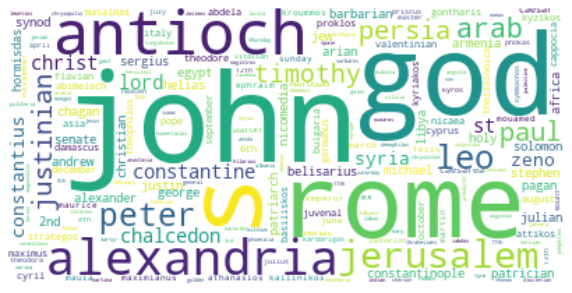

In [85]:
"6.Word cloud for Propernoun!"
words_to_ignore_list = ['year','years', 'ad','many','sent','bishop','persian']
pos_prpnoun_big_string = ' '.join(text_propernoun_list)
for word in words_to_ignore_list:
  pos_prpnoun_big_string = pos_prpnoun_big_string.replace(word, "")

theo_cloud = WordCloud(collocations = False, background_color = 'white').generate(pos_prpnoun_big_string)
plt.figure(figsize=(10,10))
plt.imshow(theo_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

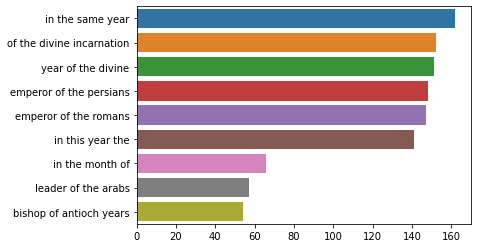

In [86]:
"""7. Tri-gram & n-gram analysis- To understand the importance of phrases"""

import seaborn as sns
import numpy as np
from collections import  Counter
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer


def plot_ngrams(text, n=4):
    stop_words=set(stopwords.words('english'))
    new_string= text.str.split()
    new_string=new_string.values.tolist()
    corpus=[word for i in new_string for word in i]

    def _get_top_ngram(corpus, n=None):
        vector = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_words = vector.transform(corpus)
        sum = bag_words.sum(axis=0)
        words_frequency = [(word, sum[0, idx]) 
                      for word, idx in vector.vocabulary_.items()]
        words_frequency =sorted(words_frequency, key = lambda x: x[1],reverse=True)
        
        return words_frequency[:9]

    n_grams=_get_top_ngram(text,n)[:9]
    a,b=map(list,zip(*n_grams))
    sns.barplot(x=b,y=a)

plot_ngrams(theo_df['Theo_sentences'],4)

In [87]:
theo_df

,Theo_sentences
0,am 5777 ad 284/5
1,year of the divine incarnation 277
2,diocletian emperor of the romans 20 years 1st ...
3,varraches emperor of the persians 17 years 15t...
4,gaius 29th bishop of rome3 15 years 7th year
...,...
10211,when the latter had refused he returned to his...
10212,having admired the walls of the city and the e...
10213,grasping this opportunity the emperor tried to...
10214,incensed at this the wretch sent a raiding par...


Data Cleaning of Training entities

In [88]:
"""Common method for cleaning data"""
def clean_data(type_data_set,data_set,t_series):
  for element in t_series:
    element = element.strip().lower() #Removing whitespaces & converting to lower cases.
    element = element.split(',')[0].strip() #Accepting only the first value.
    element = element.split('/')[0].strip()
    element = element.split('(')[0].strip()
    if type_data_set == "Person":
      if "imp" in element:
        element = element.split('imp')[0].strip()
        data_set.add(element)
      else:
        data_set.add(element)
    elif type_data_set == 'Groups':
      data_set.add(element)
    elif type_data_set == 'Settlements':
      data_set.add(element)
  return data_set

In [89]:
"""Cleaning data for Settlements"""
import pandas as pd
data_frame = pd.read_csv('Settlements.csv')
type_data_set = "Settlements"
settlements_series = data_frame.squeeze()
settlements_set = set()
settlements_set = clean_data(type_data_set,settlements_set,settlements_series)
settlements_df = pd.DataFrame(settlements_set) 
settlements_df

,0
0,belisarius
1,varna
2,stama
3,salon
4,mount of olives
...,...
660,anagyroi of paulina
661,kynegion
662,quaestorium
663,helenianai


In [90]:
"""Cleaning data for People"""
data_frame = pd.read_csv('Person.csv')
type_data_set = 'Person'
people_series = data_frame.squeeze()
people_set = set()
people_set = clean_data(type_data_set, people_set, people_series)
people_set_df = pd.DataFrame(people_set) 
people_set_df

,0
0,yazdgerd
1,belisarius
2,thomas ii
3,oumaros
4,antony
...,...
522,symmachos
523,maximianus
524,licinius
525,salustius


In [91]:
"""Cleaning data for Groups"""
data_frame = pd.read_csv('Groups.csv')
type_data_set = 'Groups'
groups_series = data_frame.squeeze()
groups_set = set()
groups_set = clean_data(type_data_set, groups_set, groups_series)
groups_set_df = pd.DataFrame(groups_set) 
groups_set_df

,0
0,galatians
1,visigoths
2,burgari
3,isamites
4,iberians
...,...
141,monotheletes
142,persians
143,theopaschites
144,arsacids


In [92]:
"Common Elements"
def intersection(people_set,groups_set,settlements_set):
  intersection_elements= people_set.intersection(groups_set)
  print(intersection_elements)
  intersection_elements_1= people_set.intersection(settlements_set)
  print(intersection_elements_1)
  intersection_elements_2 = settlements_set.intersection(groups_set)
  print(intersection_elements_1)

intersection(people_set,groups_set,settlements_set)

{'silvianus', 'huns'}
{'belisarius', 'amorion', 'maximinus', 'rufus', 'theodosios i', 'pelagios', 'konon', 'areobindos', 'anastasios', 'hormisdas', 'justinian i', 'john', 'asklepios', 'kyros', 'akakios', 'alexander', 'antiochos', 'laurentius', 'herakleios'}
{'belisarius', 'amorion', 'maximinus', 'rufus', 'theodosios i', 'pelagios', 'konon', 'areobindos', 'anastasios', 'hormisdas', 'justinian i', 'john', 'asklepios', 'kyros', 'akakios', 'alexander', 'antiochos', 'laurentius', 'herakleios'}


In [93]:
"""To avoid conflicts while training the model"""
people_set = people_set -{'huns','pelagios','amorion'}
settlements_set = settlements_set -{'justinian i', 'rufus', 'asklepios', 'alexander', 'areobindos', 'kyros', 'laurentius',\
                                    'theodosios i', 'john', 'antiochos', 'herakleios', 'hormisdas', 'akakios', 'anastasios', 'maximinus',\
                                    'belisarius', 'konon'}
groups_set = groups_set-{'silvianus','justinian i', 'rufus', 'asklepios', 'alexander', 'areobindos', 'kyros', 'laurentius',\
                                    'theodosios i', 'john', 'antiochos', 'herakleios', 'hormisdas', 'akakios', 'anastasios', 'maximinus',\
                                    'belisarius', 'konon','schismatics','syllektos'}

In [94]:
"""Add new elements"""
new_settlements_set = set(['baths of deuxippos','baths of diocletian','baths of helenianai','baths of alexander',
                   'baths of dagistheus','cathedral','copper market','st vincent','st stephen of aurelianai',
                   'st stephen in the daphne','blachernai','st laurence','statue of constantine','koreion bath'])
new_people_set = set(['plato','cyril','galerius','domnus','ninilingis','vararanes',
'theopaschites','george','makarios','theodore','visigoths','leo','eudokia','felix','peter','paul',
'kalonymos of alexandria','phylarch','theokotos','pulpita','valentinian',
'st john','gregorys','gregorys','dorotheos','kyklobiion','izid','anastasios','moamed'])
new_groups_set = set(['chalcedonians','manichaeans','macedonians',
'promontory','ionians',
'opsikians','corinthians','trinconch',
'sicilians','chrasis','arourites',
'semalouous','lebanese',
'babylonians','boniface'])

Model Building for Entity Recognition using Spacy

In [95]:
"Generalized method to store and return the data in a dataframe"
def entity_recognition_df(nlp_model):
  entities = []
  for sentence in theo_list:
    if sentence[:3]=='am ':
      year = sentence[:7]
      sentence_id = 0
    corp_sentence = nlp(sentence)
    for entity in corp_sentence.ents:
      list_to_df = [year,sentence_id, str(entity.label_.upper()), str(entity.text)]
      if (str(entity.label_.upper())=='PERSON') or (str(entity.label_.upper())=='GPE') or \
      (str(entity.label_.upper())=='NORP') or (str(entity.label_.upper())=='LOC') or \
      (str(entity.label_.upper())=='ORG') :
        entities.append(list_to_df)
        sentence_id = sentence_id+1
  entities_df = pd.DataFrame(entities, columns=["Year","Sentence_id", "Labels", "Entities"])
  return entities_df

In [96]:
"Entity extraction using rules"
import spacy
first_people_groups_set = set()
nlp_1 = spacy.load("en_core_web_sm")
docer = nlp_1(''.join(theo_corpus))
for token in docer:
    if token.text[-4:]=='ians':
      first_people_groups_set.add(token.text)
print(first_people_groups_set)


{'magicians', 'carthaginians', 'thrakesians', 'iberians', 'corinthians', 'quinquegentians', 'apsilians', 'porphyrians', 'theodosians', 'makedonians', 'alexandrians', 'sabbatians', 'paulicians', 'messalians', 'thracians', 'barbarians', 'arians', 'novatians', 'opsikians', 'assyrians', 'syrians', 'palestinians', 'patricians', 'sarmatians', 'egyptians', 'macedonians', 'theisaurians', 'isaurians', 'mauretanians', 'chalcedonians', 'indians', 'armenians', 'historians', 'illyrians', 'scythians', 'sklavinians', 'cappadocians', 'babylonians', 'abasgians', 'melitians', 'barians', 'lykaonians', 'ethiopians', 'phoenicians', 'numidians', 'bulgarians', 'physicians', 'sicilians', 'persians', 'mesopotamians', 'ionians', 'christians'}


In [97]:
"Concatenate two sets"
people_set = people_set.union(new_people_set,first_people_groups_set)
settlements_set = settlements_set.union(new_settlements_set)
groups_set = groups_set.union(new_groups_set)

In [98]:
"1. Inbuilt spacy-transformer model for entity recognition."
import spacy
from spacy import displacy
nlp = spacy.load("en_core_web_trf")
theo_list = theo_corpus

"Invoking entity_recognition model"
entities_df = entity_recognition_df(nlp)

In [99]:
entities_df

,Year,Sentence_id,Labels,Entities
0,am 5780,0,PERSON,vararanes emperor
1,am 5781,0,PERSON,narses
2,am 5781,1,NORP,persians
3,am 5782,0,PERSON,narses
4,am 5784,0,PERSON,narses
...,...,...,...,...
4051,am 6305,36,PERSON,michael
4052,am 6305,37,PERSON,prokopia
4053,am 6305,38,PERSON,kroummos
4054,am 6305,39,PERSON,leo


In [100]:
"2. Entity-Ruler: Pattern Matching Entity Recognition"
patterns = []
patterns_1 = []
patterns_2 = []
for element in people_set:
 patterns.append({'pattern':element,'label':'PERSON'})
for element in groups_set:
 patterns_1.append({'pattern':element,'label':'GROUPS'})
for element in settlements_set:
 patterns_2.append({'pattern':element,'label':'LOC'})

#nlp = spacy.load("en_core_web_trf")
rule = nlp.add_pipe("entity_ruler")
rule.add_patterns(patterns)
rule.add_patterns(patterns_1)
rule.add_patterns(patterns_2)

In [101]:
theo_list = theo_corpus[:]
df = entity_recognition_df(nlp)
df

,Year,Sentence_id,Labels,Entities
0,am 5777,0,PERSON,diocletian
1,am 5777,1,PERSON,persians
2,am 5777,2,PERSON,gaius
3,am 5777,3,PERSON,hymenaios
4,am 5777,4,PERSON,theonas
...,...,...,...,...
13688,am 6305,107,PERSON,s
13689,am 6305,108,PERSON,kroummos
13690,am 6305,109,LOC,the palace
13691,am 6305,110,LOC,hippodrome


In [102]:
df

,Year,Sentence_id,Labels,Entities
0,am 5777,0,PERSON,diocletian
1,am 5777,1,PERSON,persians
2,am 5777,2,PERSON,gaius
3,am 5777,3,PERSON,hymenaios
4,am 5777,4,PERSON,theonas
...,...,...,...,...
13688,am 6305,107,PERSON,s
13689,am 6305,108,PERSON,kroummos
13690,am 6305,109,LOC,the palace
13691,am 6305,110,LOC,hippodrome


In [103]:
"""Evaluation of Named Entity Recogniton:
First evaluation:
1. Get the union of all sets
2. Get all the unique output
3. Check if all the elements in the input data given is extracted
4. Check the other elements that have been identified and check them manually."""

union_elements= people_set.union(groups_set,settlements_set)
#print(len(union_elements))
"""Iterating throught the dataframe"""

evaluation_set_to_add = set()
for index, row in df.iterrows():
    for index_1, value_1 in row.items():
      if index_1 == 'Year' or index_1 =='Sentence_id' or index_1 =='Labels'  :
        pass
      else:
          evaluation_set_to_add.add(value_1)
print(set(evaluation_set_to_add).difference(union_elements))

{'george 6th year', 'marouam 2nd year', 'majorica', 'pikridios', 'vitus', 'isakios', 'agelon', 'bulgarian', 'masalmas', 'berzilia', 'eulogios 25th year', 'euphrasios 4th year', 'britain', 'mesopotamia', 'the cursus publicus', 'athanasios 23rd year', 'adeser emperor of the persians', 'a western iberian', 'african', 'bithynia', 'leo koutzodaktylos', 'oualid lsam s', 'the river nile', 'adraigan', 'the armeniacs leo', 'another judas iscariot', 'caesar nikephoros', 'koutzinas', 'amalasuntha theuderich s', 'sophia', 'arkadios 11th', 'pulcheria', 'the spatharios petronas', 'severa', 'praylios', 'herald kalopodios', 'severa gratian', 'vararanes emperor', 'crete', 'banakas', 'baram', 'theodore 3rd year', 'michael melissinos', 'egypt', 'abasgia lazica', 'the goths united', 'thrace christopher', 'illyrian', 'maeotid lake', 'lad', 'benedict bishop', 'sain', 'phalaris', 'isam 3rd year', 'lupicia', 'theodore the sakellarios', 'athanasios 31st', 'recimer', 'baanes', 'staurakios nikephoros', 'the logo

In [104]:
"""Iterating throught the dataframe"""
input_d = {}
count=0
index_v = 0
set_to_add = set()
for index, row in df.iterrows():
    count=count+1
    for index_1, value_1 in row.items():
      if index_1 == 'Year':
        if index_v == value_1:
          pass
        else:
          index_v = value_1
          set_to_add = set()
      elif index_1 =='Sentence_id':
          pass
      elif index_1 =='Labels':
          pass
      else:
          if value_1=='s':
            pass
          else:
            set_to_add.add(value_1)
      input_d[index_v] = list(set_to_add)

print(input_d)

{'am 5777': ['diocletian', 'gaius', 'alexandria', 'antioch', 'tyrannos', 'hymenaios', 'persians', 'theonas'], 'am 5778': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5779': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5780': ['maximianus herculius', 'diocletian', 'gaius', 'vararanes emperor', 'tyrannos', 'hymenaios', 'persians'], 'am 5781': ['diocletian', 'gaius', 'tyrannos', 'hymenaios', 'persians', 'narses'], 'am 5782': ['maximianus herculius', 'koptos', 'diocletian', 'gaius', 'tyrannos', 'hymenaios', 'narses', 'hobousiris'], 'am 5783': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5784': ['gaius', 'diocletian', 'narses', 'tyrannos'], 'am 5785': ['maximianus herculius', 'diocletian', 'gaius', 'maximianus', 'tyrannos', 'hymenaios', 'galerius', 'narses'], 'am 5786': ['diocletian', 'alexandria', 'peter', 'marcellinus bishop', 'tyrannos', 'hymenaios', 'rome'], 'am 5787': ['maximianus herculius', 'diocletian', 'peter', 'marcellinus', 'tyrannos', 'eusebios'], 'am 

In [105]:
"""Manual fixing of the names"""
"6100 is a problem"
dictionary_of_mapping = {'constantine':[{'constantine I':'5797-5828'},{'constantine II' :'5829-5852'},
                        {'constantine IV':'6161-6177'},{'constantine V':'6233-6267'},
                        {'constantine VI':'6273-6289'}],'leo':[{'Leo I':'5950-5966'},{'Leo III':'6209-6232'},
                        {'Leo IV':'6268-6272'}],'justin':[{'justin I':'6011-6019'},{'Justin II':'6058-6070'}],
                        'justinian':[{'Justinian I':' 6020-6057'},{'Justinian II':'6178-6187'}],
                        'theodosios':[{'Theodosios I':'5871-5886'},{'Theodosios II':'5901-5942'},{'theodosios III':'6208'}]}

input_new={}
for key, value in input_d.items():
  new_list=[]
  key_int = int(key[3:])
  flg=0
  for list_value in value:
    print("List value::", list_value)
    if list_value =='constantine':
      print("Yes")
      value_dict_map = dictionary_of_mapping.get(list_value)
      print("Value dict map:",value_dict_map)
      for each_dictionary in value_dict_map:
        print(each_dictionary)
        for key_11, value_11 in each_dictionary.items():
          value1=int(value_11[0:4])
          value2=int(value_11[5:])
          if  value1<= key_int<=value2:
            list_v = key_11
            new_list.append(list_v)
            flg=1
            print("Flag is set to 1")
      print(flg)
      if flg==0:
        new_list.append(list_value)
    else:
      new_list.append(list_value)
  input_new[key]=new_list

Streaming output truncated to the last 5000 lines.
List value:: avars
List value:: constantinople
List value:: the palace
List value:: domnus
List value:: alexandria
List value:: jerusalem
List value:: churches
List value:: persians
List value:: chosroes emperor
List value:: the churches
List value:: belisarius
List value:: selymbria
List value:: peter
List value:: senate
List value:: antioch
List value:: pelagios
List value:: rome
List value:: apolinarios
List value:: anastasian
List value:: sergius
List value:: barbarians
List value:: drypia
List value:: chiton
List value:: the gates
List value:: arkadioupolis
List value:: kalopodios
List value:: the walls
List value:: eutychios
List value:: the great church
List value:: dekaton
List value:: constantinople
List value:: danube
List value:: domnus
List value:: persians
List value:: alexander
List value:: alexandria
List value:: jerusalem
List value:: thrace
List value:: hippodrome
List value:: chosroes emperor
List value:: peter
List v

In [106]:
print(input_new)

{'am 5777': ['diocletian', 'gaius', 'alexandria', 'antioch', 'tyrannos', 'hymenaios', 'persians', 'theonas'], 'am 5778': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5779': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5780': ['maximianus herculius', 'diocletian', 'gaius', 'vararanes emperor', 'tyrannos', 'hymenaios', 'persians'], 'am 5781': ['diocletian', 'gaius', 'tyrannos', 'hymenaios', 'persians', 'narses'], 'am 5782': ['maximianus herculius', 'koptos', 'diocletian', 'gaius', 'tyrannos', 'hymenaios', 'narses', 'hobousiris'], 'am 5783': ['diocletian', 'gaius', 'tyrannos', 'hymenaios'], 'am 5784': ['gaius', 'diocletian', 'narses', 'tyrannos'], 'am 5785': ['maximianus herculius', 'diocletian', 'gaius', 'maximianus', 'tyrannos', 'hymenaios', 'galerius', 'narses'], 'am 5786': ['diocletian', 'alexandria', 'peter', 'marcellinus bishop', 'tyrannos', 'hymenaios', 'rome'], 'am 5787': ['maximianus herculius', 'diocletian', 'peter', 'marcellinus', 'tyrannos', 'eusebios'], 'am 

In [107]:
"Drop unwanted column Sentence_Id"
new_data_df = df.drop(columns="Sentence_id")
"Removal of duplicates"
ndf = new_data_df.drop_duplicates(keep='first')

In [108]:
ndf

,Year,Labels,Entities
0,am 5777,PERSON,diocletian
1,am 5777,PERSON,persians
2,am 5777,PERSON,gaius
3,am 5777,PERSON,hymenaios
4,am 5777,PERSON,theonas
...,...,...,...
13677,am 6305,LOC,the walls
13678,am 6305,LOC,theotokos
13684,am 6305,LOC,blachernai
13685,am 6305,LOC,golden


In [109]:
#Total number of Unique counts:
counts = ndf.Labels.nunique()
print(counts)
group_1=ndf.loc[ndf['Labels'] == "NORP" ].nunique()
group_2=ndf.loc[ndf['Labels'] == "ORG" ].nunique()
place_1=ndf.loc[ndf['Labels'] == "LOC" ].nunique()
place_2=ndf.loc[ndf['Labels'] == "GPE" ].nunique()
person =ndf.loc[ndf['Labels'] == "PERSON"].nunique()

print("Group1::", group_1)
print("Group2::", group_2)
print("Place_1::", place_1)
print("Place_2::",place_2)
print("Person::",person)

5
Group1:: Year        309
Labels        1
Entities    232
dtype: int64
Group2:: Year        67
Labels       1
Entities    42
dtype: int64
Place_1:: Year        469
Labels        1
Entities    554
dtype: int64
Place_2:: Year        204
Labels        1
Entities    193
dtype: int64
Person:: Year        528
Labels        1
Entities    929
dtype: int64


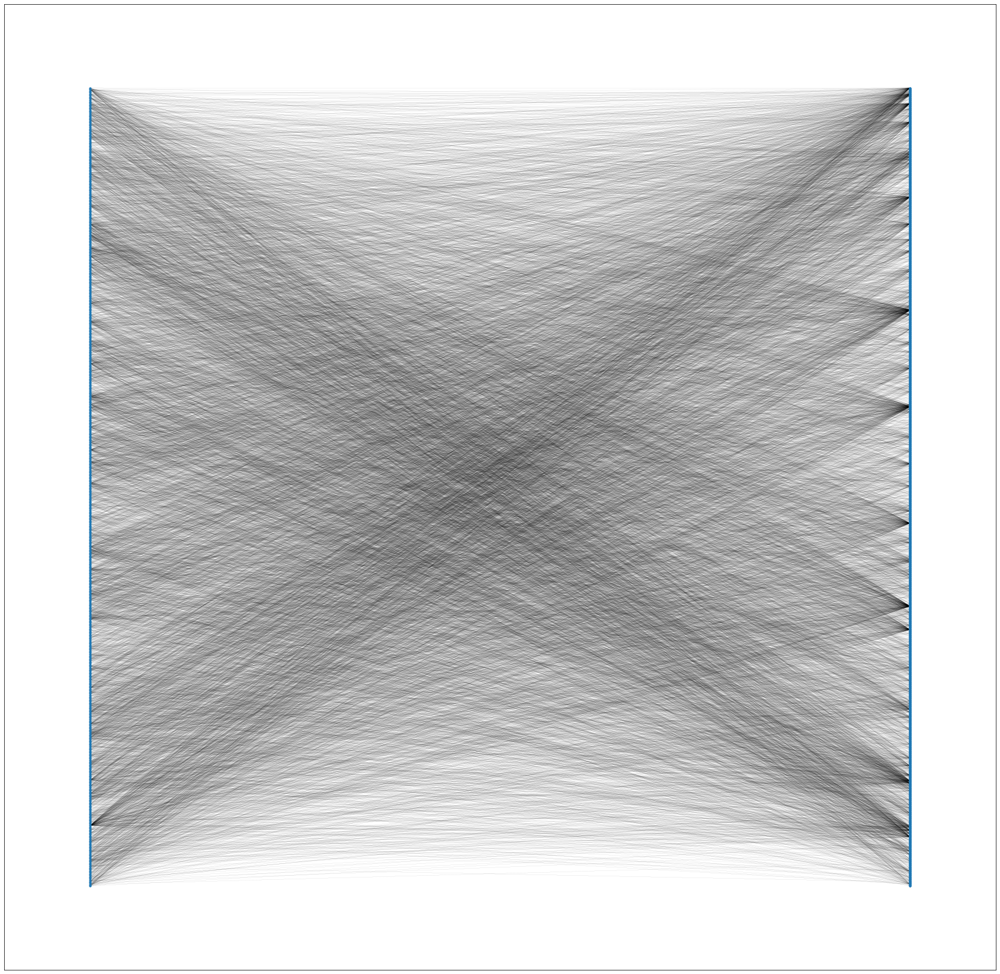

In [110]:
"""Network Construction
1. A. Construction of Bipartite graph
   B. Entities of Interest:
      People;People-Group;Places
""" 

from networkx.algorithms import bipartite
from networkx.drawing.layout import bipartite_layout
import networkx as nx
import matplotlib.pyplot as plt
src=[]
des=[]
edge_list = []
set_desc= set()

for key, values in input_d.items():
  src.append(key)
  for value in values:
    tuple_1 = (key, value)
    set_desc.add(value)
    edge_list.append(tuple_1)
desc = list(set_desc)

B = nx.Graph()
B.add_nodes_from(src, bipartite=0)
for e in src:
  B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
B.add_nodes_from(desc, bipartite=1)
for e in desc:
    if e in groups_set:
      B.nodes[e]['viz'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0,'m': 0,'y':0}}
    elif e in people_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g':0, 'b': 255, 'a': 0,'m': 0,'y':0}}
    elif e in settlements_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
    else:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255,'b': 0, 'a': 0, 'm': 255, 'y':0}}
B.add_edges_from(edge_list)
nx.is_connected(B)
nx.write_gexf(B, "Bi_Partite_Nodes.gexf")
plt.figure(figsize=(30,30))
nx.draw_networkx(B, pos = nx.drawing.layout.bipartite_layout(B, src),with_labels=False, node_size=10, width = 0.05)
plt.show()

In [111]:
def plot_individual_motifs(dictionary,year):
  src = [year]
  desc= dictionary[year]
  edge_list=[]

  #Construction of edges list:
  for element in  desc:
    tuple_r = (year, element)
    edge_list.append(tuple_r)
    #Construction of a tuple for edges:
  print(edge_list)
  B = nx.Graph()

  plt.figure(figsize=(20,20))
  B.add_nodes_from(src, bipartite=0)
  for e in src:
    B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
  B.add_nodes_from(desc, bipartite=1)
  for e in desc:
    if e in groups_set:
      B.nodes[e]['viz'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0,'m': 0,'y':0}}
    elif e in people_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g':0, 'b': 255, 'a': 0,'m': 0,'y':0}}
    elif e in settlements_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
    else:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g':  255, 'b': 0, 'a': 255, 'm': 255, 'y':0}}
  B.add_edges_from(edge_list)
  nx.is_connected(B)
  nx.draw_networkx(B, pos = nx.drawing.layout.bipartite_layout(B, src),with_labels=True, node_size=4000, width = 2)
  nx.write_gexf(B, "Single_Node.gexf")
  plt.show()


[('am 5782', 'maximianus herculius'), ('am 5782', 'koptos'), ('am 5782', 'diocletian'), ('am 5782', 'gaius'), ('am 5782', 'tyrannos'), ('am 5782', 'hymenaios'), ('am 5782', 'narses'), ('am 5782', 'hobousiris')]


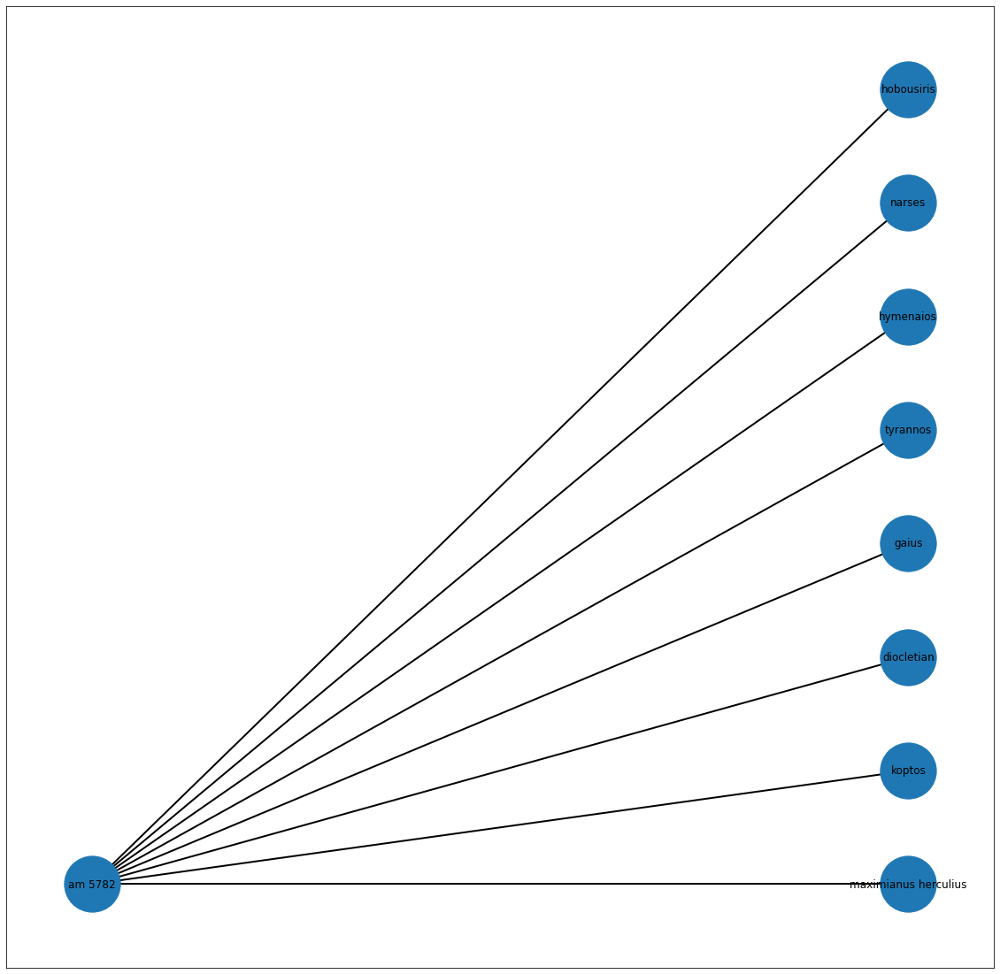

In [112]:
"""Historian can specify the year to be checked"""
"Year starts with AM 5777"
plot_individual_motifs(input_d,'am 5782')

In [113]:
"""COMPARISON::
1. When two separate nodes are given, then get the details of the nodes from the list. Then construct network of the the given two nodes.
2. Calculate or obtain the similarity index of those two elements.
3. Draw a network with common elements in the center and the the years in the side.
Refer research paper."""

import networkx as nx
def plot_comparative_motifs(dictionary,year_1, year_2):

  src = [year_1]
  desc= input_d[year_1]
  edge_list=[]
  #Construction of edges list:
  for element in  desc:
    tuple_r = (year_1, element)
    edge_list.append(tuple_r)
    #Construction of a tuple for edges:
  print(edge_list)
  B = nx.Graph()
  B.add_nodes_from(src, bipartite=0)
  for e in src:
    B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
  B.add_nodes_from(desc, bipartite=1)
  for e in desc:
    if e in groups_set:
      B.nodes[e]['viz'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0,'m': 0,'y':0}}
    elif e in people_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g':0, 'b': 255, 'a': 0,'m': 0,'y':0}}
    elif e in settlements_set:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
    else:
      B.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
  B.add_edges_from(edge_list)

  "Year-2::"
  src = [year_2]
  desc= input_d[year_2]
  edge_list=[]
  #Construction of edges list:
  for element in  desc:
    tuple_r = (year_2, element)
    edge_list.append(tuple_r)
    #Construction of a tuple for edges:
  print(edge_list)
  C = nx.Graph()
  C.add_nodes_from(src, bipartite=0)
  for e in src:
    C.nodes[e]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
  C.add_nodes_from(desc, bipartite=1)
  for e in desc:
    if e in groups_set:
      C.nodes[e]['viz'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0,'m': 0,'y':0}}
    elif e in people_set:
      C.nodes[e]['viz'] = {'color': {'r': 255, 'g':0, 'b': 255, 'a': 0,'m': 0,'y':0}}
    elif e in settlements_set:
      C.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
    else:
      C.nodes[e]['viz'] = {'color': {'r': 255, 'g': 255, 'b': 0,  'm': 0,'y':255,'a': 0}}
    
  C.add_edges_from(edge_list)
  G3 = nx.compose(B, C)
  nx.drawing.layout.bipartite_layout(G3, src)
  plt.figure(figsize=(10,10))
  nx.draw_networkx(G3,with_labels=False, node_size=250, width = 0.5)
  nx.write_gexf(G3, "Composed_Nodes.gexf")
  plt.show()

[('am 6003', 'schismatics'), ('am 6003', 'antioch'), ('am 6003', 'chalcedon'), ('am 6003', 'makedonios'), ('am 6003', 'helias'), ('am 6003', 'sidon'), ('am 6003', 'eutropios'), ('am 6003', 'theodoret'), ('am 6003', 'soterichos of caesarea'), ('am 6003', 'the gates'), ('am 6003', 'anastasios'), ('am 6003', 'caesarea'), ('am 6003', 'flavian'), ('am 6003', 'john'), ('am 6003', 'the synod of chalcedon'), ('am 6003', 'halikarnassos'), ('am 6003', 'the palace'), ('am 6003', 'caria'), ('am 6003', 'zeno'), ('am 6003', 'theodore'), ('am 6003', 'of julian'), ('am 6003', 'symmachos'), ('am 6003', 'the church'), ('am 6003', 'jerusalem'), ('am 6003', 'severus'), ('am 6003', 'salustius'), ('am 6003', 'archangel'), ('am 6003', 'kabades'), ('am 6003', 'diodoros'), ('am 6003', 'christians')]
[('am 6005', 'zacharias'), ('am 6005', 'nestorios'), ('am 6005', 'antioch'), ('am 6005', 'chalcedon'), ('am 6005', 'makedonios'), ('am 6005', 'rome'), ('am 6005', 'vitalian'), ('am 6005', 'helias'), ('am 6005', 'su

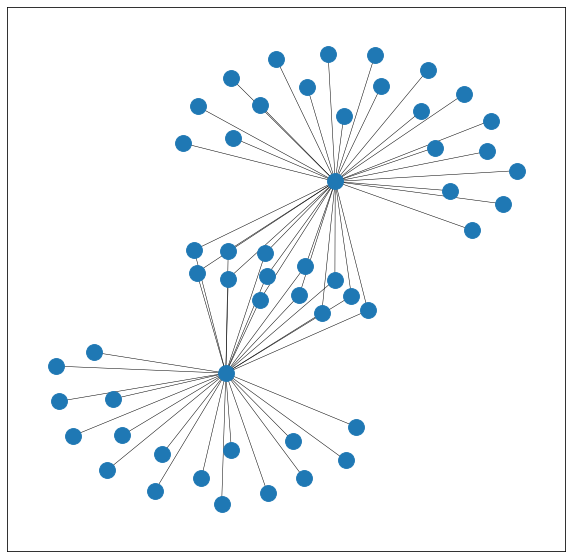

In [114]:
"""Historian can specify the years to be compared"""
plot_comparative_motifs(input_d,'am 6003','am 6005')

Calculation of Jaccard Index - Similarity

In [115]:
"""JACCARD INDEX: Construction of tuple for jaccard index coefficient calculation"""
final_list_for_jaccard_index = []
list_a = list_a=list(input_d.keys())
list_b = list_a.copy()
for a_element in list_a:
  for b_element in list_b:
    if a_element ==b_element:
      pass
    else:
      #construct a tuple:
      tuple_for_jaccard_index = ()
      tuple_for_jaccard_index=(a_element,b_element)
      final_list_for_jaccard_index.append(tuple_for_jaccard_index)

import pandas as pd
first_node=[]
second_node=[]
jaccard_index=[]

calculations = nx.jaccard_coefficient(B,final_list_for_jaccard_index )
for node_a, node_b, jac_index in calculations:
    first_node.append(node_a)
    second_node.append(node_b)
    jaccard_index.append(jac_index)

df_ji = pd.DataFrame(list(zip(first_node,second_node,jaccard_index)))
df_ji.columns = ["First_Node", "Second_Node", "Jaccard_Index"]
print(df_ji)

       First_Node Second_Node  Jaccard_Index
0         am 5777     am 5778       0.500000
1         am 5777     am 5779       0.500000
2         am 5777     am 5780       0.500000
3         am 5777     am 5781       0.555556
4         am 5777     am 5782       0.333333
...           ...         ...            ...
278251    am 6305     am 6300       0.046154
278252    am 6305     am 6301       0.103896
278253    am 6305     am 6302       0.098361
278254    am 6305     am 6303       0.159091
278255    am 6305     am 6304       0.237113

[278256 rows x 3 columns]


CLUSTERING BASED ON SIMILARITY

In [116]:
output_cluster_1 = df_ji[(df_ji['Jaccard_Index']<0.25)]
output_cluster_2 = df_ji[(df_ji['Jaccard_Index']<0.5) & (df_ji['Jaccard_Index']>=0.25)]
output_cluster_3 = df_ji[(df_ji['Jaccard_Index']<0.75) & (df_ji['Jaccard_Index']>=0.5)]
output_cluster_4 = df_ji[(df_ji['Jaccard_Index']<1.0) &(df_ji['Jaccard_Index']>=0.75)]

In [117]:
#Iterate through the dataframe and get the list of nodes.
node_set1=node_set2=node_set3=node_set4=set()
node_list1=node_list2=node_list3=node_list4=[]

In [118]:
def node_list_generation(df):
  node_set=set()
  for index, row in df.iterrows():
    for index_1, value_1 in row.items():
      if index_1=='First_Node' or index_1=='Second_Node': 
        node_set.add(value_1)
  node_list=list(node_set)
  return node_list

In [119]:
node_list1=node_list_generation(output_cluster_1)
node_list2=node_list_generation(output_cluster_2)
node_list3=node_list_generation(output_cluster_3)
node_list4=node_list_generation(output_cluster_4)


Community Detection using Louvain Algorithm

In [120]:
"""Threshold of Jaccard Index: 0.2"""
output_cluster_5 = df_ji[(df_ji['Jaccard_Index']>0.2)]

In [121]:
node_list5=node_list_generation(output_cluster_5)

In [122]:
"""Construction of Graph"""
import networkx as nx
G=nx.Graph()
def cluster_df(df,count):
  for index, row in df.iterrows():
    first_node=second_node=0
    jaccard_index=0.0
    fn=sn=ji=0
    for index_11, value_11 in row.items():
      if index_11 =='First_Node':
        first_node = value_11
        fn =1
      elif index_11 =='Second_Node':
        second_node = value_11
        sn=1
      else:
        jaccard_index = value_11
        ji=1
      if fn ==1 and sn ==1 and ji==1:
        if count ==1:
          G.add_edge(first_node,second_node,color='r', weight=(jaccard_index/50))
          G.nodes[first_node]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
          G.nodes[second_node]['viz'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
          fn=sn=ji=0
       
cluster_df(output_cluster_5,1)

In [123]:
def draw_louvain_cluster(G, pos, measures, measure_name):
    clusters=np.array(list(set(measures.values())))
    plt.figure(figsize=(25,25))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=mcolors.ListedColormap(plt.cm.Set3(clusters)), 
                                   node_color=list(measures.values()),
                                   nodelist=list(measures.keys()))

    edges = nx.draw_networkx_edges(G, pos)
    nx.write_gexf(G, "Cluster_Louvain.gexf")
    cobar = plt.colorbar(nodes,ticks=range(0,len(clusters)), label='Communities')
    cobar.ax.tick_params(length=0)
    plt.axis('off')
    plt.show()

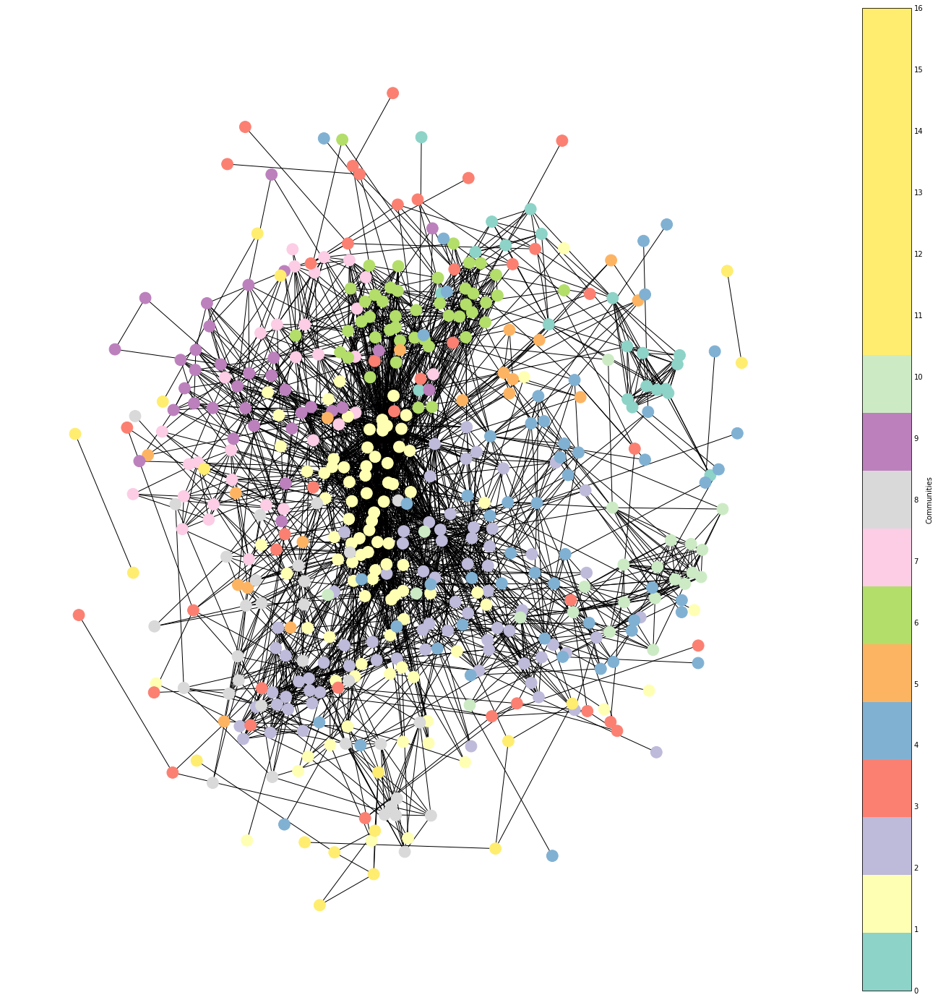

In [124]:
"""Code for Louvain Algorithm"""
import matplotlib.colors as mcolors 
from community import community_louvain
partition = community_louvain.best_partition(G)
pos = nx.spring_layout(G)
draw_louvain_cluster(G,pos,partition,'Community-Detection-Louvain')

Code_of_Trial_Error

In [125]:
##Code of Trial & Error
"""Construction of G"""
import networkx as nx
G=nx.Graph()
def cluster_df(df,count):
  for index, row in df.iterrows():
    first_node=second_node=0
    jaccard_index=0.0
    fn=sn=ji=0
    for index_11, value_11 in row.items():
      if index_11 =='First_Node':
        first_node = value_11
        fn =1
      elif index_11 =='Second_Node':
        second_node = value_11
        sn=1
      else:
        jaccard_index = value_11
        ji=1
      if fn ==1 and sn ==1 and ji==1:
        if count ==1:
          G.add_edge(first_node,second_node,color='r', weight=(jaccard_index/50))
          G.nodes[first_node]['v'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
          G.nodes[second_node]['v'] = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
          fn=sn=ji=0
        elif count==2:
          G.add_edge(first_node,second_node,color='g', weight=(jaccard_index/50))
          G.nodes[first_node]['v'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}
          G.nodes[second_node]['v'] = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}
          fn=sn=ji=0
        else:
          G.add_edge(first_node,second_node,color='b', weight=(jaccard_index/50))
          G.nodes[first_node]['v'] = {'color': {'r': 0, 'g': 0, 'b': 255, 'a': 0}}
          G.nodes[second_node]['v'] = {'color': {'r': 0, 'g': 0, 'b': 255, 'a': 0}}
          fn=sn=ji=0

cluster_df(output_cluster_1,0)
cluster_df(output_cluster_2,1)
cluster_df(output_cluster_3,2)
cluster_df(output_cluster_4,3)

In [126]:
print(G)

Graph with 528 nodes and 139125 edges


In [127]:
"""Method_draw the clusters"""
import matplotlib.colors as mcolors
def cluster(G, pos, measures, name):
    clusters=np.array(list(set(measures.values())))
    print(clusters)
    plt.figure(figsize=(25,25))
    print(list(measures.keys()))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=mcolors.ListedColormap(plt.cm.Set3(clusters)), 
                                   node_color=list(measures.values()),
                                   nodelist=list(measures.keys()))

    labels = nx.draw_networkx_labels(G, pos)
    print(labels)
    edges = nx.draw_networkx_edges(G, pos)
    nx.write_gexf(G, "Cluster_sample.gexf", version="1.2draft")
    cobar = plt.colorbar(nodes,ticks=range(0,len(clusters)), label='Communities')
    cobar.ax.tick_params(length=0)
    nodes.set_clim(-0.5, len(clusters)-0.5)
    plt.axis('off')
    plt.show()

In [128]:
"""Partition logic::"""
common_dictionary = {}
for each_element in node_list1:
  common_dictionary[each_element] = 0
for each_element in node_list2:
    common_dictionary[each_element] = 1
for each_element in node_list3:
    common_dictionary[each_element] = 2
for each_element in node_list4:
    common_dictionary[each_element] = 3    
print(common_dictionary)
print(len(common_dictionary))

{'am 6046': 1, 'am 6284': 0, 'am 5934': 2, 'am 6011': 1, 'am 6189': 2, 'am 6278': 1, 'am 5793': 1, 'am 5902': 2, 'am 6047': 2, 'am 6179': 1, 'am 5881': 2, 'am 6127': 1, 'am 5886': 2, 'am 5859': 1, 'am 5798': 2, 'am 6039': 1, 'am 5856': 1, 'am 6092': 1, 'am 6040': 1, 'am 6246': 0, 'am 6293': 0, 'am 6097': 1, 'am 6119': 1, 'am 6120': 0, 'am 5841': 2, 'am 5978': 1, 'am 5840': 1, 'am 5777': 2, 'am 5878': 1, 'am 5997': 1, 'am 6282': 0, 'am 6124': 1, 'am 5837': 1, 'am 6023': 1, 'am 5905': 1, 'am 5834': 2, 'am 5929': 2, 'am 6100': 1, 'am 5778': 2, 'am 5790': 3, 'am 6026': 0, 'am 6191': 1, 'am 6254': 0, 'am 5844': 2, 'am 6128': 1, 'am 6126': 2, 'am 5796': 1, 'am 5984': 1, 'am 6030': 1, 'am 6181': 1, 'am 6220': 0, 'am 6109': 2, 'am 5846': 2, 'am 5799': 1, 'am 6015': 1, 'am 6163': 1, 'am 6271': 0, 'am 5860': 0, 'am 5868': 1, 'am 6207': 0, 'am 6243': 1, 'am 5849': 0, 'am 6176': 2, 'am 6075': 1, 'am 6195': 1, 'am 5944': 1, 'am 6051': 1, 'am 6299': 0, 'am 5955': 1, 'am 6071': 1, 'am 5816': 0, 'am 5

[0 1 2 3]
['am 6046', 'am 6284', 'am 5934', 'am 6011', 'am 6189', 'am 6278', 'am 5793', 'am 5902', 'am 6047', 'am 6179', 'am 5881', 'am 6127', 'am 5886', 'am 5859', 'am 5798', 'am 6039', 'am 5856', 'am 6092', 'am 6040', 'am 6246', 'am 6293', 'am 6097', 'am 6119', 'am 6120', 'am 5841', 'am 5978', 'am 5840', 'am 5777', 'am 5878', 'am 5997', 'am 6282', 'am 6124', 'am 5837', 'am 6023', 'am 5905', 'am 5834', 'am 5929', 'am 6100', 'am 5778', 'am 5790', 'am 6026', 'am 6191', 'am 6254', 'am 5844', 'am 6128', 'am 6126', 'am 5796', 'am 5984', 'am 6030', 'am 6181', 'am 6220', 'am 6109', 'am 5846', 'am 5799', 'am 6015', 'am 6163', 'am 6271', 'am 5860', 'am 5868', 'am 6207', 'am 6243', 'am 5849', 'am 6176', 'am 6075', 'am 6195', 'am 5944', 'am 6051', 'am 6299', 'am 5955', 'am 6071', 'am 5816', 'am 5780', 'am 5897', 'am 5883', 'am 6161', 'am 6081', 'am 6222', 'am 5863', 'am 6056', 'am 5920', 'am 6177', 'am 5956', 'am 6013', 'am 6027', 'am 5845', 'am 5958', 'am 6274', 'am 5811', 'am 5894', 'am 6199',

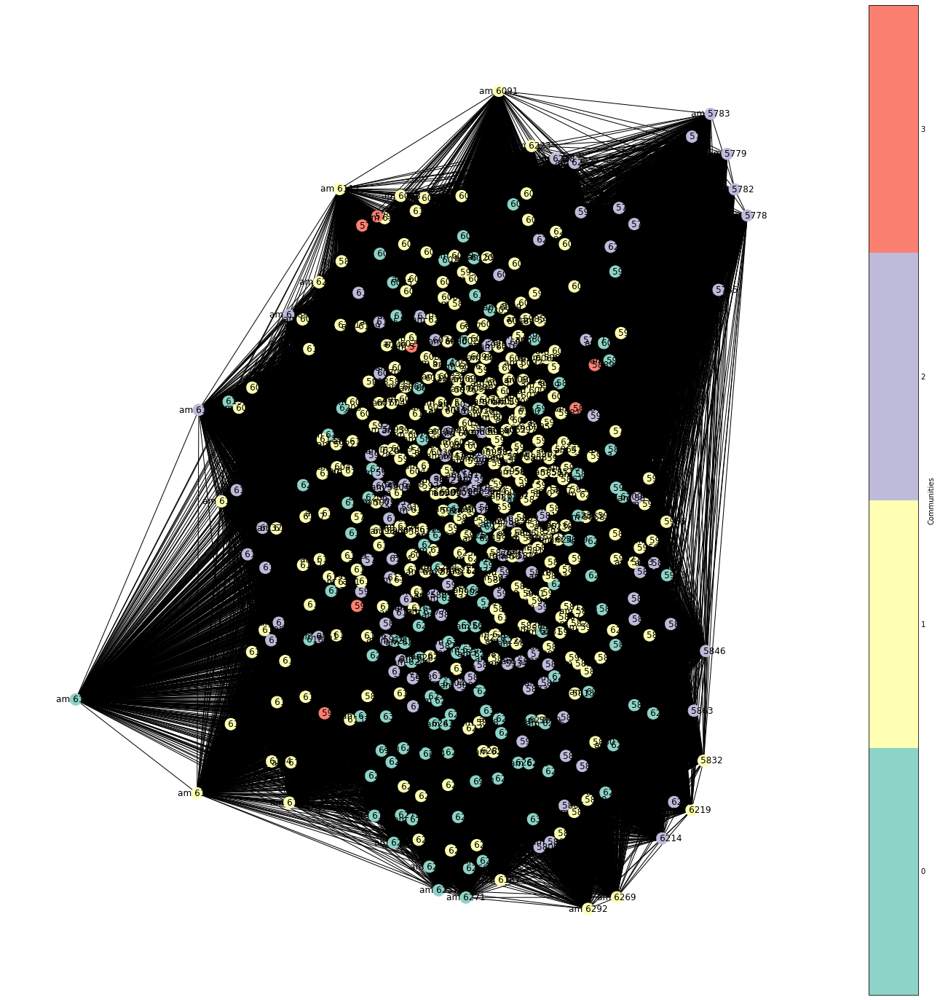

In [129]:
"""Code of Jaccard Similarity"""
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors 

partition = common_dictionary
pos = nx.spring_layout(G)
cluster(G,pos,partition,'Jaccard Index- Cluster')